# Exploratory Data Analysis (EDA)

## Load extended packages

In [1]:
#data science packages
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, f_regression, mutual_info_regression

#visualisation packages
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colorbar as mcb
import seaborn as sns
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde

# time-series packages
from datetime import datetime
from scipy.interpolate import interp1d
from sklearn.metrics import mean_squared_error
import random
from statsmodels.tsa.arima.model import ARIMA
from statsmodels import robust
from numpy import polyfit, poly1d
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


## Load datasets

In [2]:
air_df = pd.read_csv('../778project/auckland_data.csv')
air_df

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,ET10(C),ET20(C),ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount
0,2020-01-01,36.125000,21.589583,29.608696,-0.004348,7.566667,13.591667,317,1.8,224,...,19.7,19.6,-,19.1,1018.6,1016.7,6.9,19.03,8631.990268,358.250000
1,2020-01-02,20.895833,15.750000,37.869565,0.016667,5.120833,9.416667,226,3.5,196,...,19.2,19.6,-,19.1,1014.6,1012.7,9.4,21.61,10138.637470,651.330357
2,2020-01-03,27.927083,27.144792,41.826087,0.004348,10.140278,17.835417,266,4.5,216,...,20.3,19.8,-,19.1,1008.0,1006.1,9.3,20.18,9291.510949,447.879464
3,2020-01-04,43.343750,19.431522,38.608696,0.000000,9.586111,23.555208,222,6.5,215,...,18.4,19.2,-,19.2,1008.7,1006.8,7.2,18.62,8757.687348,352.015625
4,2020-01-05,45.385417,32.413439,40.136364,-0.018182,8.267210,19.488834,246,3.8,298,...,18.4,18.5,-,19.2,1012.5,1010.6,4.3,10.36,11109.727941,888.281250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,36.270833,30.493750,48.765833,0.952174,8.277778,14.376042,359,1.4,16,...,9.0,9.6,-,12.4,1016.7,1014.8,0.6,4.41,10735.478261,434.606557
1327,2023-08-20,20.770833,35.242391,52.997917,1.233333,4.033333,7.472237,349,1.5,304,...,11.1,10.7,-,12.2,1005.4,1003.5,0.8,5.14,8876.103198,271.606996
1328,2023-08-21,28.436141,25.593750,62.969583,1.265217,7.970395,19.063542,250,7.0,237,...,10.5,10.8,-,12.2,1003.4,1001.5,3.4,7.08,10663.613043,814.182377
1329,2023-08-22,41.171196,46.639130,50.296250,1.358333,8.440833,20.026042,189,2.2,177,...,9.8,10.3,-,12.1,1021.9,1019.9,10.3,14.64,11362.219718,867.473896


In [3]:
air_df['Date'] = pd.to_datetime(air_df['Date'])
air_df.dtypes

Date                           datetime64[ns]
Daily Average AQI                     float64
Daily Average NOx (ug/m3)             float64
Daily Average O3 (ug/m3)              float64
Daily Average SO2 (ug/m3)             float64
Daily Average PM2.5 (ug/m3)           float64
Daily Average PM10 (ug/m3)            float64
WDir(Deg)                               int64
WSpd(m/s)                             float64
GustDir(Deg)                           object
GustSpd(m/s)                           object
WindRun(Km)                            object
Rain(mm)                              float64
Tdry(C)                               float64
TWet(C)                               float64
RH(%)                                 float64
Tmax(C)                               float64
Tmin(C)                               float64
Tgmin(C)                              float64
ET05(C)                                object
ET10(C)                               float64
ET20(C)                           

In [4]:
cols = ['WDir(Deg)', 'GustDir(Deg)', 'GustSpd(m/s)', 'WindRun(Km)','ET05(C)', 'ET30(C)', 'Sun(Hrs)']
air_df[cols] = air_df[cols].replace('-', np.nan).astype(float)
air_df[cols] = air_df[cols].astype('float64')
air_df.dtypes

Date                           datetime64[ns]
Daily Average AQI                     float64
Daily Average NOx (ug/m3)             float64
Daily Average O3 (ug/m3)              float64
Daily Average SO2 (ug/m3)             float64
Daily Average PM2.5 (ug/m3)           float64
Daily Average PM10 (ug/m3)            float64
WDir(Deg)                             float64
WSpd(m/s)                             float64
GustDir(Deg)                          float64
GustSpd(m/s)                          float64
WindRun(Km)                           float64
Rain(mm)                              float64
Tdry(C)                               float64
TWet(C)                               float64
RH(%)                                 float64
Tmax(C)                               float64
Tmin(C)                               float64
Tgmin(C)                              float64
ET05(C)                               float64
ET10(C)                               float64
ET20(C)                           

In [5]:
air_df.describe()

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,ET10(C),ET20(C),ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount
count,1331,1196.000000,1323.000000,1280.000000,1307.000000,1326.000000,1331.000000,1331.000000,1331.000000,1330.000000,...,1331.000000,1331.000000,0.0,1331.000000,1331.000000,1331.000000,1330.000000,1331.000000,1331.000000,1331.000000
mean,2021-10-27 00:00:00,25.763985,34.852245,38.799522,0.996351,6.256631,14.099369,183.685199,2.419159,163.987218,...,16.642524,16.842675,NaN,17.684222,1016.273554,1014.355823,6.416992,13.658227,10695.983535,766.202638
min,2020-01-01 00:00:00,8.000000,2.480556,7.555714,-0.166667,1.230769,4.784722,0.000000,0.000000,1.000000,...,7.100000,8.800000,NaN,12.100000,978.400000,976.600000,0.000000,0.610000,1079.929426,80.404110
25%,2020-11-28 12:00:00,20.460711,19.214962,29.910973,0.412772,4.900876,11.156250,98.000000,1.000000,60.000000,...,13.200000,13.800000,NaN,15.100000,1011.200000,1009.300000,3.525000,7.795000,9693.075647,462.374326
50%,2021-10-27 00:00:00,25.114583,29.990278,37.675743,0.840909,6.059085,13.587500,184.000000,2.100000,181.000000,...,16.800000,17.100000,NaN,18.000000,1016.700000,1014.800000,6.600000,12.120000,11446.739529,925.259912
75%,2022-09-24 12:00:00,30.067708,46.328963,46.168478,1.297619,7.320833,16.740217,257.500000,3.500000,238.750000,...,20.100000,19.900000,NaN,20.100000,1021.300000,1019.400000,9.300000,19.110000,12399.204695,1007.091703
max,2023-08-23 00:00:00,61.041667,141.946032,70.667083,9.666667,18.884783,37.826190,360.000000,11.400000,360.000000,...,25.800000,25.100000,NaN,22.400000,1038.600000,1036.600000,14.000000,31.930000,14502.254137,1201.937500
std,NaN,7.807897,20.585541,11.128777,0.922908,2.027946,4.427285,100.946152,1.668528,99.320471,...,4.003284,3.620335,NaN,2.640792,8.074418,8.054667,3.720233,7.247329,2554.172205,302.562499


## Feature engineering

In [6]:
print(air_df.columns)
print(air_df.info())

Index(['Date', 'Daily Average AQI', 'Daily Average NOx (ug/m3)',
       'Daily Average O3 (ug/m3)', 'Daily Average SO2 (ug/m3)',
       'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)',
       'WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)', 'GustSpd(m/s)', 'WindRun(Km)',
       'Rain(mm)', 'Tdry(C)', 'TWet(C)', 'RH(%)', 'Tmax(C)', 'Tmin(C)',
       'Tgmin(C)', 'ET05(C)', 'ET10(C)', 'ET20(C)', 'ET30(C)', 'ET100(C)',
       'Pmsl(hPa)', 'Pstn(hPa)', 'Sun(Hrs)', 'Rad(MJ/m2)', 'lightCount',
       'heavyCount'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1331 entries, 0 to 1330
Data columns (total 30 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Date                         1331 non-null   datetime64[ns]
 1   Daily Average AQI            1196 non-null   float64       
 2   Daily Average NOx (ug/m3)    1323 non-null   float64       
 3   Daily Average O3 (ug/m

In [7]:
# Add 'Month' and 'Year' columns
air_df01 = air_df.copy()
air_df01['Year'] = [d.year for d in air_df01['Date']]
air_df01['Month'] = [d.strftime('%b') for d in air_df01['Date']]
years = air_df01['Year'].unique()
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
air_df01

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month
0,2020-01-01,36.125000,21.589583,29.608696,-0.004348,7.566667,13.591667,317.0,1.8,224.0,...,NaN,19.1,1018.6,1016.7,6.9,19.03,8631.990268,358.250000,2020,Jan
1,2020-01-02,20.895833,15.750000,37.869565,0.016667,5.120833,9.416667,226.0,3.5,196.0,...,NaN,19.1,1014.6,1012.7,9.4,21.61,10138.637470,651.330357,2020,Jan
2,2020-01-03,27.927083,27.144792,41.826087,0.004348,10.140278,17.835417,266.0,4.5,216.0,...,NaN,19.1,1008.0,1006.1,9.3,20.18,9291.510949,447.879464,2020,Jan
3,2020-01-04,43.343750,19.431522,38.608696,0.000000,9.586111,23.555208,222.0,6.5,215.0,...,NaN,19.2,1008.7,1006.8,7.2,18.62,8757.687348,352.015625,2020,Jan
4,2020-01-05,45.385417,32.413439,40.136364,-0.018182,8.267210,19.488834,246.0,3.8,298.0,...,NaN,19.2,1012.5,1010.6,4.3,10.36,11109.727941,888.281250,2020,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,36.270833,30.493750,48.765833,0.952174,8.277778,14.376042,359.0,1.4,16.0,...,NaN,12.4,1016.7,1014.8,0.6,4.41,10735.478261,434.606557,2023,Aug
1327,2023-08-20,20.770833,35.242391,52.997917,1.233333,4.033333,7.472237,349.0,1.5,304.0,...,NaN,12.2,1005.4,1003.5,0.8,5.14,8876.103198,271.606996,2023,Aug
1328,2023-08-21,28.436141,25.593750,62.969583,1.265217,7.970395,19.063542,250.0,7.0,237.0,...,NaN,12.2,1003.4,1001.5,3.4,7.08,10663.613043,814.182377,2023,Aug
1329,2023-08-22,41.171196,46.639130,50.296250,1.358333,8.440833,20.026042,189.0,2.2,177.0,...,NaN,12.1,1021.9,1019.9,10.3,14.64,11362.219718,867.473896,2023,Aug


In [72]:
# Add 'Day of Week' and 'Is Weekend' columns
day_of_week = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
air_df01['Day of Week'] = air_df01['Date'].dt.weekday.map(day_of_week)
air_df01['Is Weekend'] = air_df01['Date'].dt.weekday > 4
air_df01

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount,Is Weekend
0,2020-01-01,36.125000,21.589583,29.608696,-0.004348,7.566667,13.591667,317.0,1.8,224.0,...,19.03,8631.990268,358.250000,2020,Jan,Wed,False,18.20,8990.240268,False
1,2020-01-02,20.895833,15.750000,37.869565,0.016667,5.120833,9.416667,226.0,3.5,196.0,...,21.61,10138.637470,651.330357,2020,Jan,Thu,False,19.40,10789.967827,False
2,2020-01-03,27.927083,27.144792,41.826087,0.004348,10.140278,17.835417,266.0,4.5,216.0,...,20.18,9291.510949,447.879464,2020,Jan,Fri,False,20.05,9739.390413,False
3,2020-01-04,43.343750,19.431522,38.608696,0.000000,9.586111,23.555208,222.0,6.5,215.0,...,18.62,8757.687348,352.015625,2020,Jan,Sat,True,18.40,9109.702973,True
4,2020-01-05,45.385417,32.413439,40.136364,-0.018182,8.267210,19.488834,246.0,3.8,298.0,...,10.36,11109.727941,888.281250,2020,Jan,Sun,True,17.30,11998.009191,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,36.270833,30.493750,48.765833,0.952174,8.277778,14.376042,359.0,1.4,16.0,...,4.41,10735.478261,434.606557,2023,Aug,Sat,True,9.25,11170.084818,True
1327,2023-08-20,20.770833,35.242391,52.997917,1.233333,4.033333,7.472237,349.0,1.5,304.0,...,5.14,8876.103198,271.606996,2023,Aug,Sun,True,13.60,9147.710194,True
1328,2023-08-21,28.436141,25.593750,62.969583,1.265217,7.970395,19.063542,250.0,7.0,237.0,...,7.08,10663.613043,814.182377,2023,Aug,Mon,False,12.50,11477.795421,False
1329,2023-08-22,41.171196,46.639130,50.296250,1.358333,8.440833,20.026042,189.0,2.2,177.0,...,14.64,11362.219718,867.473896,2023,Aug,Tue,False,10.65,12229.693614,False


In [9]:
# add daily average temperature column and total traffic column
air_df01['T(C)'] = air_df01[['Tmax(C)', 'Tmin(C)']].mean(axis=1)
air_df01['trafficCount'] = air_df01[['lightCount', 'heavyCount']].sum(axis=1)
air_df01

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,36.125000,21.589583,29.608696,-0.004348,7.566667,13.591667,317.0,1.8,224.0,...,6.9,19.03,8631.990268,358.250000,2020,Jan,Wed,True,18.20,8990.240268
1,2020-01-02,20.895833,15.750000,37.869565,0.016667,5.120833,9.416667,226.0,3.5,196.0,...,9.4,21.61,10138.637470,651.330357,2020,Jan,Thu,True,19.40,10789.967827
2,2020-01-03,27.927083,27.144792,41.826087,0.004348,10.140278,17.835417,266.0,4.5,216.0,...,9.3,20.18,9291.510949,447.879464,2020,Jan,Fri,True,20.05,9739.390413
3,2020-01-04,43.343750,19.431522,38.608696,0.000000,9.586111,23.555208,222.0,6.5,215.0,...,7.2,18.62,8757.687348,352.015625,2020,Jan,Sat,False,18.40,9109.702973
4,2020-01-05,45.385417,32.413439,40.136364,-0.018182,8.267210,19.488834,246.0,3.8,298.0,...,4.3,10.36,11109.727941,888.281250,2020,Jan,Sun,False,17.30,11998.009191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,36.270833,30.493750,48.765833,0.952174,8.277778,14.376042,359.0,1.4,16.0,...,0.6,4.41,10735.478261,434.606557,2023,Aug,Sat,False,9.25,11170.084818
1327,2023-08-20,20.770833,35.242391,52.997917,1.233333,4.033333,7.472237,349.0,1.5,304.0,...,0.8,5.14,8876.103198,271.606996,2023,Aug,Sun,False,13.60,9147.710194
1328,2023-08-21,28.436141,25.593750,62.969583,1.265217,7.970395,19.063542,250.0,7.0,237.0,...,3.4,7.08,10663.613043,814.182377,2023,Aug,Mon,True,12.50,11477.795421
1329,2023-08-22,41.171196,46.639130,50.296250,1.358333,8.440833,20.026042,189.0,2.2,177.0,...,10.3,14.64,11362.219718,867.473896,2023,Aug,Tue,True,10.65,12229.693614


In [10]:
# full_range = pd.date_range(start='2020-01-01', end='2023-12-31', freq='D')
# full_range = pd.DataFrame({'Date':full_range})
# full_range

# Create a helper column 'FirstOfMonth' to identify the first day of each month
air_df02 = air_df01.drop(['Year', 'Month', 'Day of Week', 'Is Weekday'], axis=1)
air_df02.set_index('Date', inplace=True)
air_df02 = air_df02.resample('M').mean()
# Reset index to make 'Date' a column again
air_df02.reset_index(inplace=True)
# Adjust 'Date' to the first day of each month
air_df02['Date'] = air_df02['Date'].values.astype('datetime64[M]')
air_df02['Year'] = [d.year for d in air_df02['Date']]
air_df02['Month'] = [d.strftime('%b') for d in air_df02['Date']]
air_df02

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,T(C),trafficCount,Year,Month
0,2020-01-01,27.761191,34.703243,32.624761,0.302676,6.094425,13.240387,232.709677,2.451613,200.451613,...,1016.161290,1014.261290,9.109677,20.798065,12016.499511,838.713238,19.558065,12855.212749,2020,Jan
1,2020-02-01,28.648419,16.590073,33.587732,0.599211,6.142656,13.698368,200.448276,2.158621,158.172414,...,1017.617241,1015.717241,9.775862,20.991034,12200.816178,856.142680,21.098276,13056.958858,2020,Feb
2,2020-03-01,24.042003,32.359147,34.374538,1.225930,5.456773,11.783691,204.193548,2.112903,167.129032,...,1016.458065,1014.558065,7.183871,14.767419,9394.432551,737.338761,18.585484,10131.771313,2020,Mar
3,2020-04-01,24.215851,27.436429,37.965086,0.484300,5.350874,12.625338,182.233333,1.926667,163.066667,...,1016.420000,1014.513333,6.860000,11.474000,2911.859185,348.303764,16.191667,3260.162949,2020,Apr
4,2020-05-01,26.687953,40.648599,37.238354,1.092683,6.224186,13.012256,170.967742,2.109677,134.741935,...,1020.200000,1018.267742,4.922581,7.209032,8366.559115,706.778097,14.016129,9073.337212,2020,May
5,2020-06-01,25.294912,48.151347,42.858395,0.972624,5.667118,12.054522,155.433333,2.046667,148.933333,...,1017.786667,1015.846667,4.143333,5.879667,10898.921161,787.644344,13.176667,11686.565505,2020,Jun
6,2020-07-01,27.159289,62.449757,47.350249,0.669958,6.299413,12.966846,162.838710,2.151613,186.387097,...,1017.345161,1015.396774,3.658065,5.835161,11663.484624,797.805278,11.625806,12461.289902,2020,Jul
7,2020-08-01,29.671283,49.432153,51.835510,0.601656,6.905058,14.498223,199.580645,2.383871,191.935484,...,1013.867742,1011.925806,5.258065,8.584194,8398.245274,747.802198,12.309677,9146.047472,2020,Aug
8,2020-09-01,29.309659,53.589197,52.519038,0.660648,6.275590,14.991645,233.266667,2.980000,219.666667,...,1020.380000,1018.433333,6.653333,12.846667,11118.131370,863.728062,12.935000,11981.859432,2020,Sep
9,2020-10-01,24.943212,40.482819,44.133971,0.449340,5.272337,12.779839,172.870968,2.235484,144.161290,...,1023.090323,1021.167742,7.425806,16.211613,11896.157777,844.627448,15.519355,12740.785225,2020,Oct


In [11]:
air_df03 = air_df01.drop(['Year', 'Month', 'Day of Week', 'Is Weekday'], axis=1)
air_df03.set_index('Date', inplace=True)

weekday_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}

air_df03['Day of Week'] = air_df03.index.weekday.map(weekday_map)

air_df03 = air_df03.groupby([air_df03.index.year, 'Day of Week']).mean()
air_df03.reset_index(inplace=True)

day_order = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
air_df03['Day of Week'] = pd.Categorical(air_df03['Day of Week'], categories=day_order, ordered=True)

air_df03 = air_df03.sort_values(['Date', 'Day of Week'])
air_df03.rename(columns={'Date': 'Year'}, inplace=True)

air_df03

,Year,Day of Week,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),...,ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,T(C),trafficCount
1,2020,Mon,26.495991,41.470982,39.722211,0.729633,5.886581,13.807320,187.461538,2.300000,...,NaN,17.371154,1016.973077,1015.055769,6.457692,13.361154,10863.956673,953.394413,16.156731,11817.351086
5,2020,Tue,27.397199,43.817730,39.490615,0.742867,5.873358,13.880209,211.692308,2.725000,...,NaN,17.375000,1015.951923,1014.036538,6.078846,12.515000,11051.980499,960.273590,16.141346,12012.254089
6,2020,Wed,27.998983,46.198601,40.091061,0.693220,6.124091,14.012319,181.490566,2.398113,...,NaN,17.403774,1016.500000,1014.583019,6.581132,13.378868,10916.977196,919.404792,15.696226,11836.381989
4,2020,Thu,27.648106,45.584258,40.546595,0.579069,5.809996,13.316492,200.528302,2.245283,...,NaN,17.415094,1016.801887,1014.881132,6.543396,13.374151,11220.696551,908.451286,15.751887,12129.147837
0,2020,Fri,26.908689,48.203769,41.335810,0.691075,6.160937,13.866006,211.826923,2.434615,...,NaN,17.380769,1017.805769,1015.882692,7.180769,14.357885,9503.048704,468.653168,15.634615,9971.701872
2,2020,Sat,27.388499,34.816781,39.995534,0.543378,6.020401,12.900801,166.711538,2.192308,...,NaN,17.363462,1018.830769,1016.903846,7.230769,14.497692,8109.198587,300.823931,15.697115,8410.022518
3,2020,Sun,26.285082,24.839865,41.118253,0.452110,5.891099,12.901079,175.134615,2.490385,...,NaN,17.367308,1018.682692,1016.763462,7.001923,14.185769,10186.311574,866.139397,15.875962,11052.450971
8,2021,Mon,26.859232,36.590153,36.747559,0.904755,6.399556,14.763382,188.480769,2.273077,...,NaN,17.400000,1014.913462,1013.001923,6.563462,14.679423,10438.552915,921.360780,16.403846,11359.913695
12,2021,Tue,27.739661,39.845141,37.055742,0.822202,6.326431,14.788265,198.403846,2.815385,...,NaN,17.401923,1014.417308,1012.509615,6.136538,13.689615,10681.487475,942.303286,16.646154,11623.790761
13,2021,Wed,28.579257,46.339640,36.423079,1.262532,6.478397,15.027813,196.000000,2.355769,...,NaN,17.421154,1015.505769,1013.586538,6.303846,13.667500,10944.893375,947.964053,16.203846,11892.857428


## Data preprocessing

### Missing values

In [12]:
print(air_df01.dtypes[:10])
print(air_df01.dtypes[-10:])

Date                           datetime64[ns]
Daily Average AQI                     float64
Daily Average NOx (ug/m3)             float64
Daily Average O3 (ug/m3)              float64
Daily Average SO2 (ug/m3)             float64
Daily Average PM2.5 (ug/m3)           float64
Daily Average PM10 (ug/m3)            float64
WDir(Deg)                             float64
WSpd(m/s)                             float64
GustDir(Deg)                          float64
dtype: object
Sun(Hrs)        float64
Rad(MJ/m2)      float64
lightCount      float64
heavyCount      float64
Year              int64
Month            object
Day of Week      object
Is Weekday         bool
T(C)            float64
trafficCount    float64
dtype: object


In [13]:
# check missing values
missing_values = air_df01.isna().sum()
print(missing_values)

Date                              0
Daily Average AQI               135
Daily Average NOx (ug/m3)         8
Daily Average O3 (ug/m3)         51
Daily Average SO2 (ug/m3)        24
Daily Average PM2.5 (ug/m3)       5
Daily Average PM10 (ug/m3)        0
WDir(Deg)                         0
WSpd(m/s)                         0
GustDir(Deg)                      1
GustSpd(m/s)                      1
WindRun(Km)                       1
Rain(mm)                          0
Tdry(C)                           0
TWet(C)                           0
RH(%)                             0
Tmax(C)                           0
Tmin(C)                           0
Tgmin(C)                          0
ET05(C)                        1331
ET10(C)                           0
ET20(C)                           0
ET30(C)                        1331
ET100(C)                          0
Pmsl(hPa)                         0
Pstn(hPa)                         0
Sun(Hrs)                          1
Rad(MJ/m2)                  

Non-seasonal features

In [14]:
missing = air_df01[['Date', 'Daily Average AQI']]
# missing = missing[(missing['Date'] >= '2023-01-01') & (missing['Date'] <= '2023-08-23')]
missing.rename(columns={'Daily Average AQI': 'AQI'}, inplace=True)
missing

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\2059083872.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing.rename(columns={'Daily Average AQI': 'AQI'}, inplace=True)


,Date,AQI
0,2020-01-01,36.125000
1,2020-01-02,20.895833
2,2020-01-03,27.927083
3,2020-01-04,43.343750
4,2020-01-05,45.385417
...,...,...
1326,2023-08-19,36.270833
1327,2023-08-20,20.770833
1328,2023-08-21,28.436141
1329,2023-08-22,41.171196


C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\4165528014.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing['rownum'] = np.arange(missing.shape[0])
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\4165528014.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing['linear_fill'] = f(missing['rownum'])
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\4165528014.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

<Axes: title={'center': 'Multiple Imputation'}>

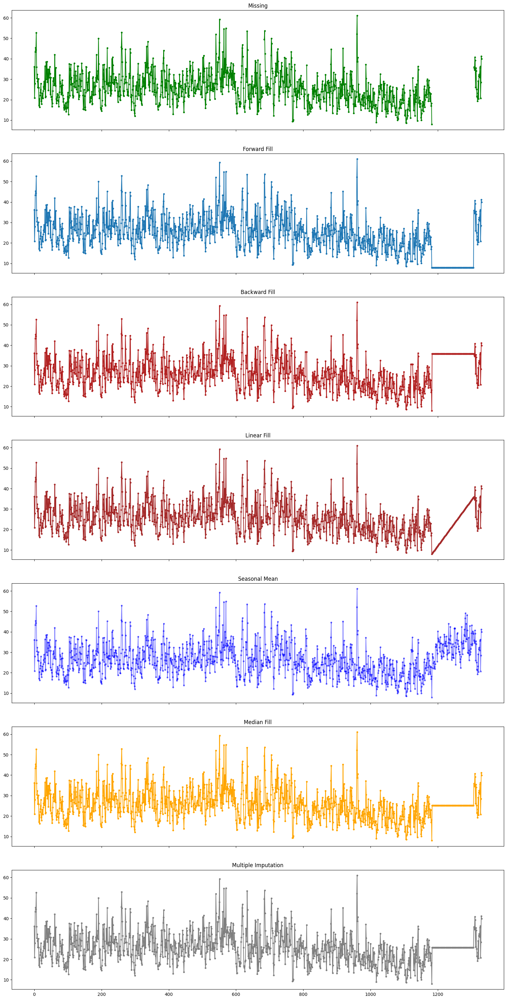

In [15]:
fig, axes = plt.subplots(7, 1, sharex=True, figsize=(20, 40))
plt.rcParams.update({'xtick.bottom' : False})

## 1. Missing -------------------------------
missing['AQI'].plot(title='Missing', ax=axes[0], label='Missing', color='green', style=".-")

## 2. Forward Fill --------------------------
df_ffill = missing.ffill()
df_ffill['AQI'].plot(title='Forward Fill', ax=axes[1], label='Forward Fill', style=".-")

## 3. Backward Fill -------------------------
df_bfill = missing.bfill()
df_bfill['AQI'].plot(title="Backward Fill", ax=axes[2], label='Back Fill', color='firebrick', style=".-")

## 4. Linear Interpolation ------------------
missing['rownum'] = np.arange(missing.shape[0])
df_nona = missing.dropna(subset = ['AQI'])
f = interp1d(df_nona['rownum'], df_nona['AQI'])
missing['linear_fill'] = f(missing['rownum'])
missing['linear_fill'].plot(title="Linear Fill", ax=axes[3], label='Linear Fill', color='brown', style=".-")

## 5. Seasonal Mean ----------------------------
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            if np.isnan(np.nanmean(ts_seas)):
                ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
            out[i] = np.nanmean(ts_seas) * lr
    return out

missing['seasonal_mean'] = seasonal_mean(missing.AQI, n=365, lr=1.25)
missing['seasonal_mean'].plot(title="Seasonal Mean", ax=axes[4], label='Seasonal Mean', color='blue', alpha=0.5, style=".-")

## 6. Median ----------------------------
missing['median_fill'] = missing['AQI'].fillna(missing['AQI'].median())
missing['median_fill'].plot(title='Median Fill', ax=axes[5], label='Median Fill', color='orange', style='.-')

## 7. Multiple Imputer
imputer = IterativeImputer(max_iter=10, random_state=0)
missing_values = missing['AQI'].values.reshape(-1, 1)
missing['multiple_impute'] = imputer.fit_transform(missing_values)
missing['multiple_impute'] = missing['multiple_impute'].ravel()
missing['multiple_impute'].plot(title='Multiple Imputation', ax=axes[6], label='Multiple Imputation', color='grey', style='.-')

Seasonal features

In [16]:
missing = air_df01[['Date', 'Daily Average O3 (ug/m3)']]
# missing = missing[(missing['Date'] >= '2022-01-01') & (missing['Date'] <= '2022-12-31')]
missing.rename(columns={'Daily Average O3 (ug/m3)': 'O3'}, inplace=True)
missing

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\1881537248.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing.rename(columns={'Daily Average O3 (ug/m3)': 'O3'}, inplace=True)


,Date,O3
0,2020-01-01,29.608696
1,2020-01-02,37.869565
2,2020-01-03,41.826087
3,2020-01-04,38.608696
4,2020-01-05,40.136364
...,...,...
1326,2023-08-19,48.765833
1327,2023-08-20,52.997917
1328,2023-08-21,62.969583
1329,2023-08-22,50.296250


C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\2194876158.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\2194876158.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\2194876158.py:33: RuntimeWarning:

Mean of empty slice

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\2194876158.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
T

<Axes: title={'center': 'Multiple Imputation'}>

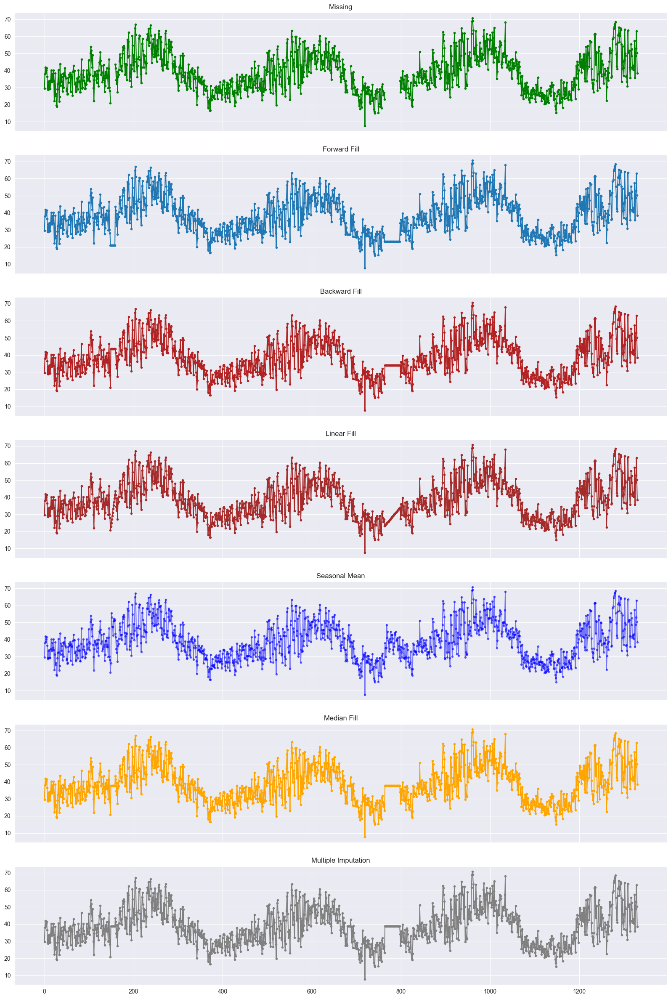

In [69]:
fig, axes = plt.subplots(7, 1, sharex=True, figsize=(20, 30))
plt.rcParams.update({'xtick.bottom' : False})

## 1. Missing -------------------------------
missing['O3'].plot(title='Missing', ax=axes[0], label='Missing', color='green', style=".-")

## 2. Forward Fill --------------------------
df_ffill = missing.ffill()
df_ffill['O3'].plot(title='Forward Fill', ax=axes[1], label='Forward Fill', style=".-")

## 3. Backward Fill -------------------------
df_bfill = missing.bfill()
df_bfill['O3'].plot(title="Backward Fill", ax=axes[2], label='Back Fill', color='firebrick', style=".-")

## 4. Linear Interpolation ------------------
missing['rownum'] = np.arange(missing.shape[0])
df_nona = missing.dropna(subset = ['O3'])
f = interp1d(df_nona['rownum'], df_nona['O3'])
missing['linear_fill'] = f(missing['rownum'])
missing['linear_fill'].plot(title="Linear Fill", ax=axes[3], label='Linear Fill', color='brown', style=".-")

## 5. Seasonal Mean ----------------------------
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            if np.isnan(np.nanmean(ts_seas)):
                ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
            out[i] = np.nanmean(ts_seas) * lr
    return out

missing['seasonal_mean'] = seasonal_mean(missing.O3, n=366, lr=1.25)
missing['seasonal_mean'].plot(title="Seasonal Mean", ax=axes[4], label='Seasonal Mean', color='blue', alpha=0.5, style=".-")

## 6. Median ----------------------------
missing['median_fill'] = missing['O3'].fillna(missing['O3'].median())
missing['median_fill'].plot(title='Median Fill', ax=axes[5], label='Median Fill', color='orange', style='.-')

## 7. Multiple Imputer
imputer = IterativeImputer(max_iter=10, random_state=0)
missing_values = missing['O3'].values.reshape(-1, 1)
missing['multiple_impute'] = imputer.fit_transform(missing_values)
missing['multiple_impute'] = missing['multiple_impute'].ravel()
missing['multiple_impute'].plot(title='Multiple Imputation', ax=axes[6], label='Multiple Imputation', color='grey', style='.-')

In [18]:
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            if np.isnan(np.nanmean(ts_seas)):
                ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
            out[i] = np.nanmean(ts_seas) * lr
    return out

df_numeric = air_df01.select_dtypes(include=[np.number])
df_filled_numeric = df_numeric.apply(lambda col: seasonal_mean(col, n=365, lr=1))
air_df04 = air_df01.copy()
air_df04[df_numeric.columns] = df_filled_numeric

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\4264940707.py:11: RuntimeWarning: Mean of empty slice
  if np.isnan(np.nanmean(ts_seas)):
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_9816\4264940707.py:13: RuntimeWarning: Mean of empty slice
  out[i] = np.nanmean(ts_seas) * lr


In [19]:
air_df04.drop(['ET05(C)', 'ET30(C)'], axis=1, inplace=True) # drop 'ET05(C) and 'ET30(C) without any values
missing_values = air_df04.isna().sum()
print(missing_values)

Date                           0
Daily Average AQI              0
Daily Average NOx (ug/m3)      0
Daily Average O3 (ug/m3)       0
Daily Average SO2 (ug/m3)      0
Daily Average PM2.5 (ug/m3)    0
Daily Average PM10 (ug/m3)     0
WDir(Deg)                      0
WSpd(m/s)                      0
GustDir(Deg)                   0
GustSpd(m/s)                   0
WindRun(Km)                    0
Rain(mm)                       0
Tdry(C)                        0
TWet(C)                        0
RH(%)                          0
Tmax(C)                        0
Tmin(C)                        0
Tgmin(C)                       0
ET10(C)                        0
ET20(C)                        0
ET100(C)                       0
Pmsl(hPa)                      0
Pstn(hPa)                      0
Sun(Hrs)                       0
Rad(MJ/m2)                     0
lightCount                     0
heavyCount                     0
Year                           0
Month                          0
Day of Wee

### Conver the categorical variables into numeric

In [20]:
no_num_cols = air_df04.select_dtypes(exclude=['number']).columns
no_num_cols = list(no_num_cols)
no_num_cols.remove('Date')
print(no_num_cols)

['Month', 'Day of Week', 'Is Weekday']


In [21]:
label_encoder = LabelEncoder()

for column in no_num_cols:
    air_df04[column] = label_encoder.fit_transform(air_df04[column])

air_df04

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,36.125000,21.589583,29.608696,-0.004348,7.566667,13.591667,317.0,1.8,224.0,...,6.9,19.03,8631.990268,358.250000,2020,4,6,1,18.20,8990.240268
1,2020-01-02,20.895833,15.750000,37.869565,0.016667,5.120833,9.416667,226.0,3.5,196.0,...,9.4,21.61,10138.637470,651.330357,2020,4,4,1,19.40,10789.967827
2,2020-01-03,27.927083,27.144792,41.826087,0.004348,10.140278,17.835417,266.0,4.5,216.0,...,9.3,20.18,9291.510949,447.879464,2020,4,0,1,20.05,9739.390413
3,2020-01-04,43.343750,19.431522,38.608696,0.000000,9.586111,23.555208,222.0,6.5,215.0,...,7.2,18.62,8757.687348,352.015625,2020,4,2,0,18.40,9109.702973
4,2020-01-05,45.385417,32.413439,40.136364,-0.018182,8.267210,19.488834,246.0,3.8,298.0,...,4.3,10.36,11109.727941,888.281250,2020,4,3,0,17.30,11998.009191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,36.270833,30.493750,48.765833,0.952174,8.277778,14.376042,359.0,1.4,16.0,...,0.6,4.41,10735.478261,434.606557,2023,1,2,0,9.25,11170.084818
1327,2023-08-20,20.770833,35.242391,52.997917,1.233333,4.033333,7.472237,349.0,1.5,304.0,...,0.8,5.14,8876.103198,271.606996,2023,1,3,0,13.60,9147.710194
1328,2023-08-21,28.436141,25.593750,62.969583,1.265217,7.970395,19.063542,250.0,7.0,237.0,...,3.4,7.08,10663.613043,814.182377,2023,1,1,1,12.50,11477.795421
1329,2023-08-22,41.171196,46.639130,50.296250,1.358333,8.440833,20.026042,189.0,2.2,177.0,...,10.3,14.64,11362.219718,867.473896,2023,1,5,1,10.65,12229.693614


In [22]:
print(air_df01['Year'].value_counts())
print(air_df04['Year'].value_counts())

Year
2020    366
2021    365
2022    365
2023    235
Name: count, dtype: int64
Year
2020    366
2021    365
2022    365
2023    235
Name: count, dtype: int64


In [23]:
print(air_df01['Month'].value_counts())
print(air_df04['Month'].value_counts())

Month
Jan    124
Mar    124
May    124
Jul    124
Apr    120
Jun    120
Aug    116
Feb    113
Oct     93
Dec     93
Sep     90
Nov     90
Name: count, dtype: int64
Month
4     124
7     124
8     124
5     124
0     120
6     120
1     116
3     113
10     93
2      93
11     90
9      90
Name: count, dtype: int64


In [24]:
print(air_df01['Day of Week'].value_counts())
print(air_df04['Day of Week'].value_counts())

Day of Week
Wed    191
Thu    190
Fri    190
Sat    190
Sun    190
Mon    190
Tue    190
Name: count, dtype: int64
Day of Week
6    191
4    190
0    190
2    190
3    190
1    190
5    190
Name: count, dtype: int64


In [25]:
print(air_df01['Is Weekday'].value_counts())
print(air_df04['Is Weekday'].value_counts())

Is Weekday
True     951
False    380
Name: count, dtype: int64
Is Weekday
1    951
0    380
Name: count, dtype: int64


### Outliers

In [26]:
# Define a function to detect outliers using IQR
def detect_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (column < lower_bound) | (column > upper_bound)

outliers = air_df04.select_dtypes(exclude='object').apply(detect_outliers)
outliers

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1327,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1328,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1329,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [27]:
# change outliers as median
for column in air_df04.select_dtypes(exclude='object').columns:
    median_value = air_df04[column].median()
    outliers_column = outliers[column]
    air_df04.loc[outliers_column, column] = median_value

air_df04

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,36.125000,21.589583,29.608696,-0.004348,7.566667,13.591667,317.0,1.8,224.0,...,6.9,19.03,8631.990268,358.250000,2020,4,6,1,18.20,8990.240268
1,2020-01-02,20.895833,15.750000,37.869565,0.016667,5.120833,9.416667,226.0,3.5,196.0,...,9.4,21.61,10138.637470,651.330357,2020,4,4,1,19.40,10789.967827
2,2020-01-03,27.927083,27.144792,41.826087,0.004348,10.140278,17.835417,266.0,4.5,216.0,...,9.3,20.18,9291.510949,447.879464,2020,4,0,1,20.05,9739.390413
3,2020-01-04,43.343750,19.431522,38.608696,0.000000,9.586111,23.555208,222.0,6.5,215.0,...,7.2,18.62,8757.687348,352.015625,2020,4,2,0,18.40,9109.702973
4,2020-01-05,25.187500,32.413439,40.136364,-0.018182,8.267210,19.488834,246.0,3.8,298.0,...,4.3,10.36,11109.727941,888.281250,2020,4,3,0,17.30,11998.009191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,36.270833,30.493750,48.765833,0.952174,8.277778,14.376042,359.0,1.4,16.0,...,0.6,4.41,10735.478261,434.606557,2023,1,2,0,9.25,11170.084818
1327,2023-08-20,20.770833,35.242391,52.997917,1.233333,4.033333,7.472237,349.0,1.5,304.0,...,0.8,5.14,8876.103198,271.606996,2023,1,3,0,13.60,9147.710194
1328,2023-08-21,28.436141,25.593750,62.969583,1.265217,7.970395,19.063542,250.0,7.0,237.0,...,3.4,7.08,10663.613043,814.182377,2023,1,1,1,12.50,11477.795421
1329,2023-08-22,41.171196,46.639130,50.296250,1.358333,8.440833,20.026042,189.0,2.2,177.0,...,10.3,14.64,11362.219718,867.473896,2023,1,5,1,10.65,12229.693614


In [28]:
print(air_df04.columns)

Index(['Date', 'Daily Average AQI', 'Daily Average NOx (ug/m3)',
       'Daily Average O3 (ug/m3)', 'Daily Average SO2 (ug/m3)',
       'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)',
       'WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)', 'GustSpd(m/s)', 'WindRun(Km)',
       'Rain(mm)', 'Tdry(C)', 'TWet(C)', 'RH(%)', 'Tmax(C)', 'Tmin(C)',
       'Tgmin(C)', 'ET10(C)', 'ET20(C)', 'ET100(C)', 'Pmsl(hPa)', 'Pstn(hPa)',
       'Sun(Hrs)', 'Rad(MJ/m2)', 'lightCount', 'heavyCount', 'Year', 'Month',
       'Day of Week', 'Is Weekday', 'T(C)', 'trafficCount'],
      dtype='object')


### Data scaling

In [29]:
columns_to_scale = ['Daily Average AQI', 'Daily Average NOx (ug/m3)', 'Daily Average O3 (ug/m3)', 
                    'Daily Average SO2 (ug/m3)', 'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)',
                    'WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)', 'GustSpd(m/s)', 'WindRun(Km)', 
                    'Rain(mm)', 'Tdry(C)', 'TWet(C)', 'RH(%)', 'Tmax(C)', 'Tmin(C)', 
                    'Tgmin(C)', 'ET10(C)', 'ET20(C)', 'ET100(C)', 'Pmsl(hPa)', 'Pstn(hPa)',
                    'Sun(Hrs)', 'Rad(MJ/m2)', 'lightCount', 'heavyCount', 'Year', 'Month',
                    'Day of Week', 'Is Weekday', 'T(C)', 'trafficCount']

# use Min-Max Scaler
scaler = MinMaxScaler()
air_df05 = air_df04.copy()
air_df05[columns_to_scale] = scaler.fit_transform(air_df05[columns_to_scale])
air_df05

,Date,Daily Average AQI,Daily Average NOx (ug/m3),Daily Average O3 (ug/m3),Daily Average SO2 (ug/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,0.793651,0.228595,0.359020,0.058569,0.651981,0.433269,0.880556,0.250000,0.621170,...,0.492857,0.588123,0.327172,0.247738,0.0,0.363636,1.000000,1.0,0.618919,0.326555
1,2020-01-02,0.363904,0.158738,0.493506,0.066151,0.394152,0.227874,0.627778,0.486111,0.543175,...,0.671429,0.670498,0.499858,0.509059,0.0,0.363636,0.666667,1.0,0.683784,0.508567
2,2020-01-03,0.562316,0.295050,0.557917,0.061706,0.923281,0.642045,0.738889,0.625000,0.598886,...,0.664286,0.624840,0.402764,0.327654,0.0,0.363636,0.000000,1.0,0.718919,0.402318
3,2020-01-04,0.997354,0.202779,0.505539,0.060137,0.864863,0.923438,0.616667,0.902778,0.596100,...,0.514286,0.575032,0.341579,0.242179,0.0,0.363636,0.333333,0.0,0.629730,0.338636
4,2020-01-05,0.485009,0.358077,0.530409,0.053577,0.725830,0.723387,0.683333,0.527778,0.827298,...,0.307143,0.311303,0.611161,0.720333,0.0,0.363636,0.500000,0.0,0.570270,0.630740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,2023-08-19,0.797766,0.335113,0.670896,0.403705,0.726944,0.471857,0.997222,0.194444,0.041783,...,0.042857,0.121328,0.568266,0.315820,1.0,0.090909,0.333333,0.0,0.135135,0.547009
1327,2023-08-20,0.360376,0.391919,0.739793,0.505155,0.279512,0.132216,0.969444,0.208333,0.844011,...,0.057143,0.144636,0.355151,0.170483,1.0,0.090909,0.500000,0.0,0.370270,0.342480
1328,2023-08-21,0.576681,0.276496,0.902131,0.516659,0.694541,0.702464,0.694444,0.972222,0.657382,...,0.242857,0.206577,0.560029,0.654263,1.0,0.090909,0.166667,1.0,0.310811,0.578129
1329,2023-08-22,0.936048,0.528255,0.695811,0.550258,0.744132,0.749816,0.525000,0.305556,0.490251,...,0.735714,0.447957,0.640101,0.701780,1.0,0.090909,0.833333,1.0,0.210811,0.654171


## Exploratory data analysis

### AQI

In [30]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average AQI for All Years'] + [f'Daily Average AQI for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average AQI'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average AQI'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average AQI in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="AQI")

fig.show()


In [31]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average AQI'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average AQI'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average AQI in Auckland',
    xaxis_title='Month',
    yaxis_title='AQI',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average AQI'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average AQI'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average AQI in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='AQI',
    height=500,
    width=1000
)

fig2.show()

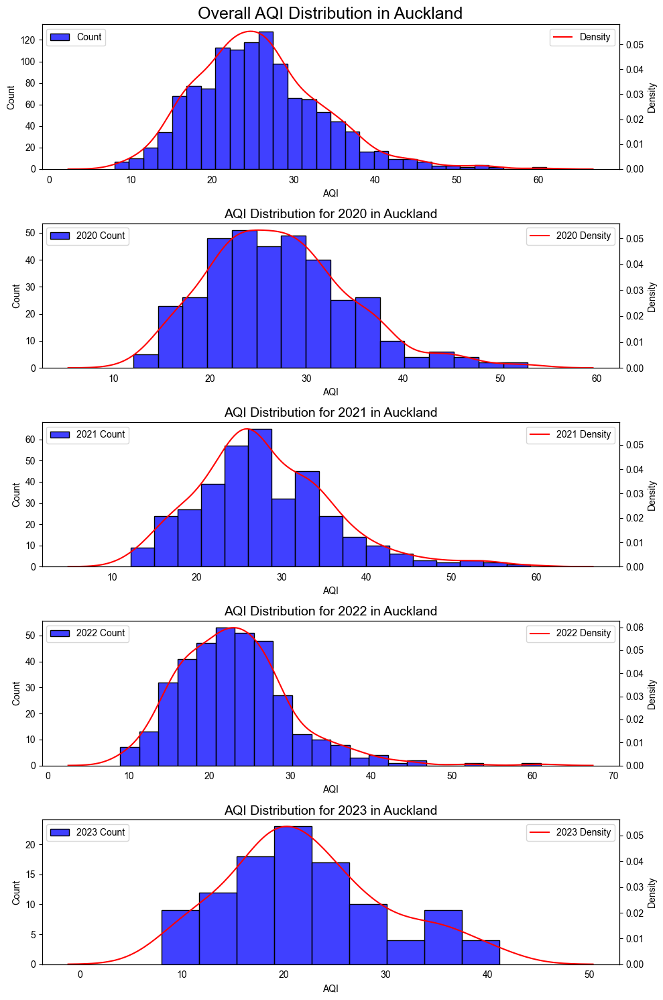

In [32]:

# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average AQI'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average AQI'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average AQI'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="AQI Distribution in Auckland",
                  yaxis1=dict(title='AQI'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average AQI'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average AQI'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall AQI Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('AQI')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average AQI'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average AQI'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'AQI Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('AQI')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### PM2.5

In [33]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average PM2.5 for All Years'] + [f'Daily Average PM2.5 for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average PM2.5 (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average PM2.5 (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average PM2.5 in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="PM2.5 (ug/m3)")

fig.show()

In [34]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average PM2.5 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average PM2.5 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average PM2.5 in Auckland',
    xaxis_title='Month',
    yaxis_title='PM2.5 (ug/m3)',
    height=500,
    width=1000
)

fig.show()

# Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average PM2.5 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average PM2.5 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average PM2.5 in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='PM2.5 (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

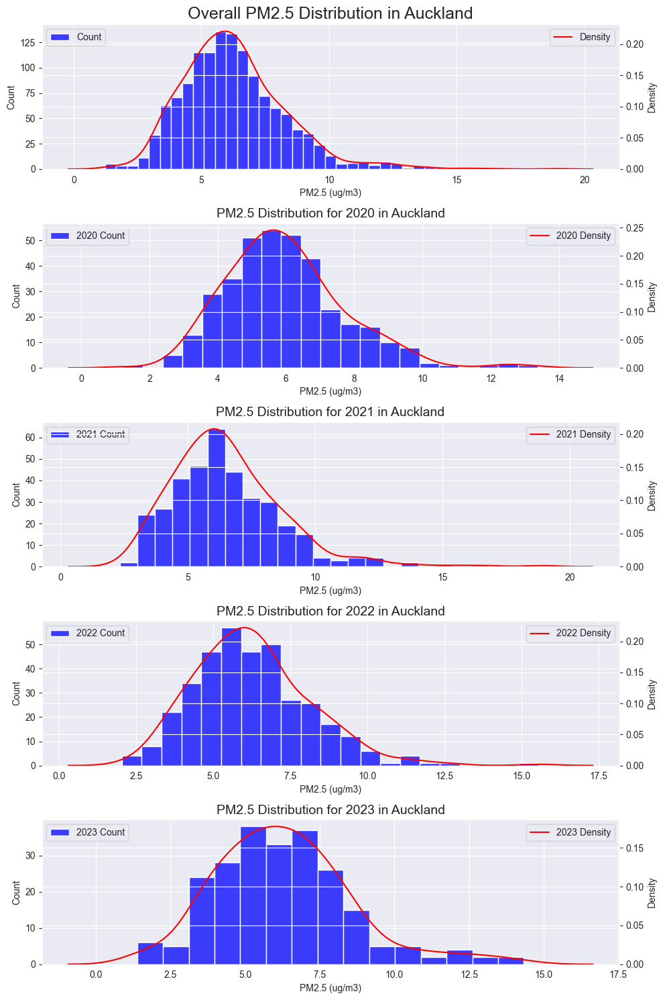

In [35]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average PM2.5 (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average PM2.5 (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average PM2.5 (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="PM2.5 Distribution in Auckland",
                  yaxis1=dict(title='PM2.5 (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average PM2.5 (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average PM2.5 (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall PM2.5 Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('PM2.5 (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average PM2.5 (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average PM2.5 (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'PM2.5 Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('PM2.5 (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### PM10

In [36]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average PM10 for All Years'] + [f'Daily Average PM10 for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average PM10 (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average PM10 (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average PM10 in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="PM10 (ug/m3)")

fig.show()

In [37]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average PM10 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average PM10 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average PM10 in Auckland',
    xaxis_title='Month',
    yaxis_title='PM10 (ug/m3)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average PM10 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average PM10 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average PM10 in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='PM10 (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

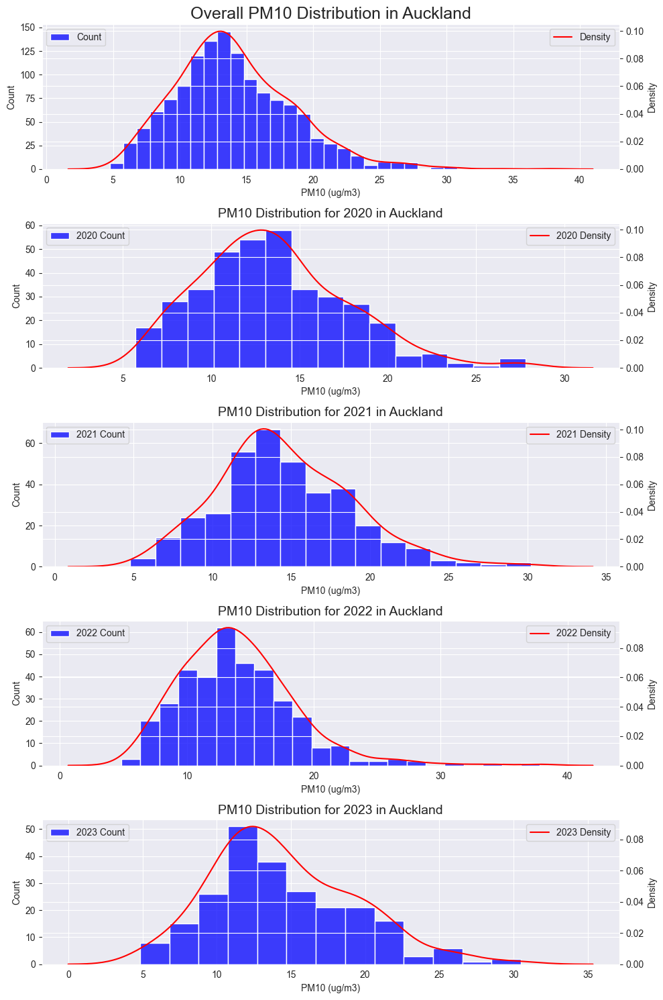

In [38]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average PM10 (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average PM10 (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average PM10 (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="PM10 Distribution in Auckland",
                  yaxis1=dict(title='PM10 (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average PM10 (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average PM10 (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall PM10 Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('PM10 (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average PM10 (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average PM10 (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'PM10 Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('PM10 (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### NOx

In [39]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average NOx for All Years'] + [f'Daily Average NOx for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average NOx (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average NOx (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average NOx in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="NOx (ug/m3)")

fig.show()

In [40]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average NOx (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average NOx (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average NOx in Auckland',
    xaxis_title='Month',
    yaxis_title='NOx (ug/m3)',
    height=500,
    width=1000
)

fig.show()

# Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average NOx (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average NOx (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average NOx in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='NOx (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

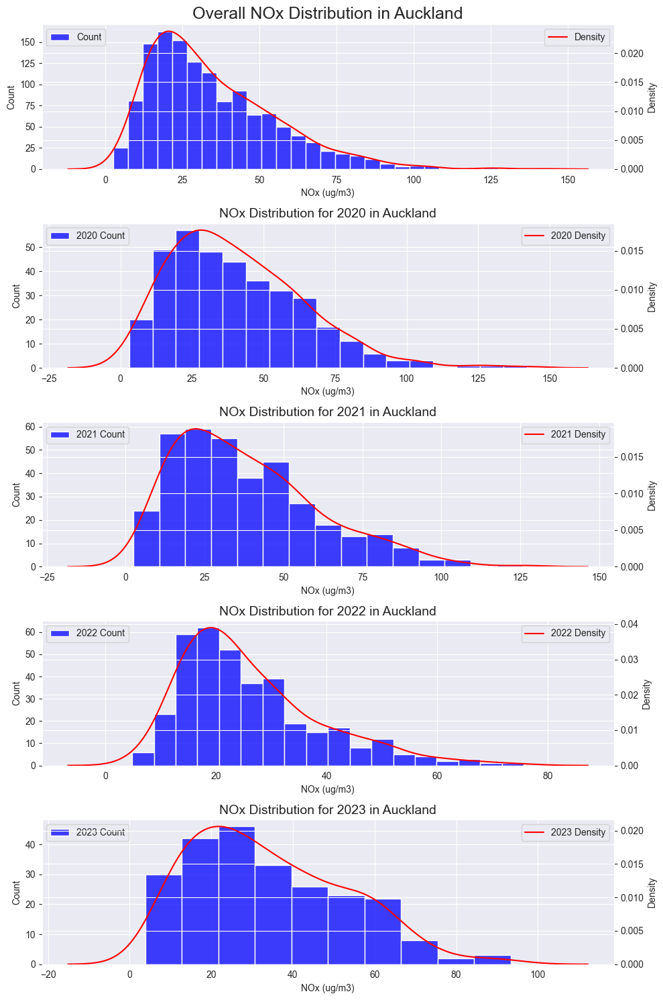

In [41]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average NOx (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average NOx (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average NOx (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="NOx Distribution in Auckland",
                  yaxis1=dict(title='NOx (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average NOx (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average NOx (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall NOx Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('NOx (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')


for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average NOx (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average NOx (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'NOx Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('NOx (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### SO2

In [42]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average SO2 for All Years'] + [f'Daily Average SO2 for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average SO2 (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average SO2 (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average SO2 in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="SO2 (ug/m3)")

fig.show()

In [43]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average SO2 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average SO2 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average SO2 in Auckland',
    xaxis_title='Month',
    yaxis_title='SO2 (ug/m3)',
    height=500,
    width=1000
)

fig.show()

# Weekly average value timw-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average SO2 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average SO2 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average SO2 in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='SO2 (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

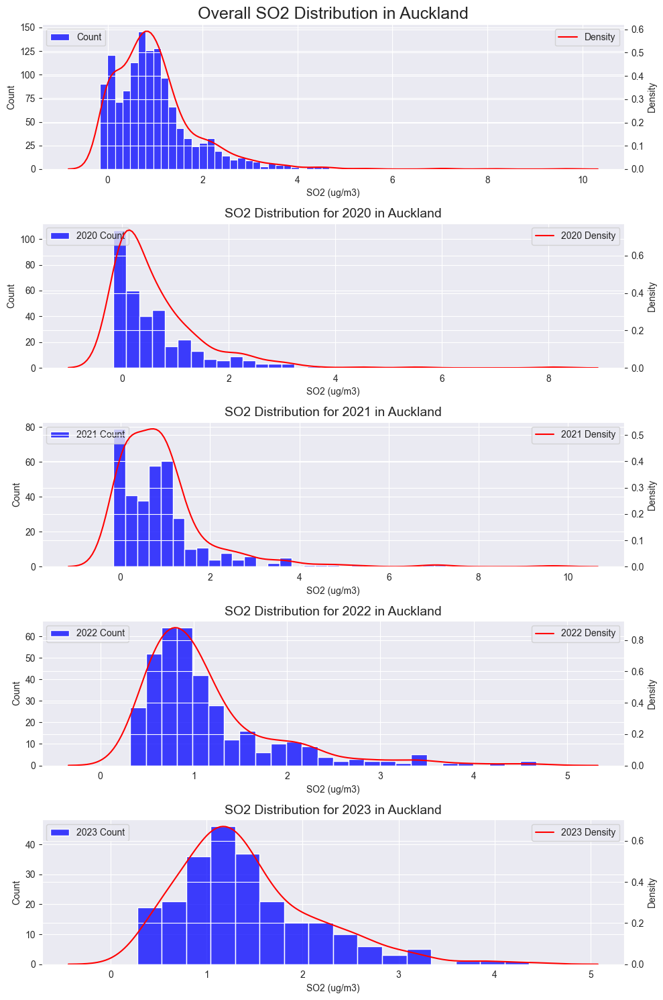

In [44]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average SO2 (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average SO2 (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average SO2 (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="SO2 Distribution in Auckland",
                  yaxis1=dict(title='SO2 (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average SO2 (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average SO2 (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall SO2 Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('SO2 (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average SO2 (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average SO2 (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'SO2 Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('SO2 (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Wind speed

In [45]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Wind Speed for All Years'] + [f'Daily Average Wind Speed for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['WSpd(m/s)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['WSpd(m/s)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Wind Speed in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Wind Speed (m/s)")

fig.show()

In [46]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['WSpd(m/s)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['WSpd(m/s)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Wind Speed in Auckland',
    xaxis_title='Month',
    yaxis_title='Wind Speed (m/s)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['WSpd(m/s)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['WSpd(m/s)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Wind Speed in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='Wind Speed (m/s)',
    height=500,
    width=1000
)

fig2.show()

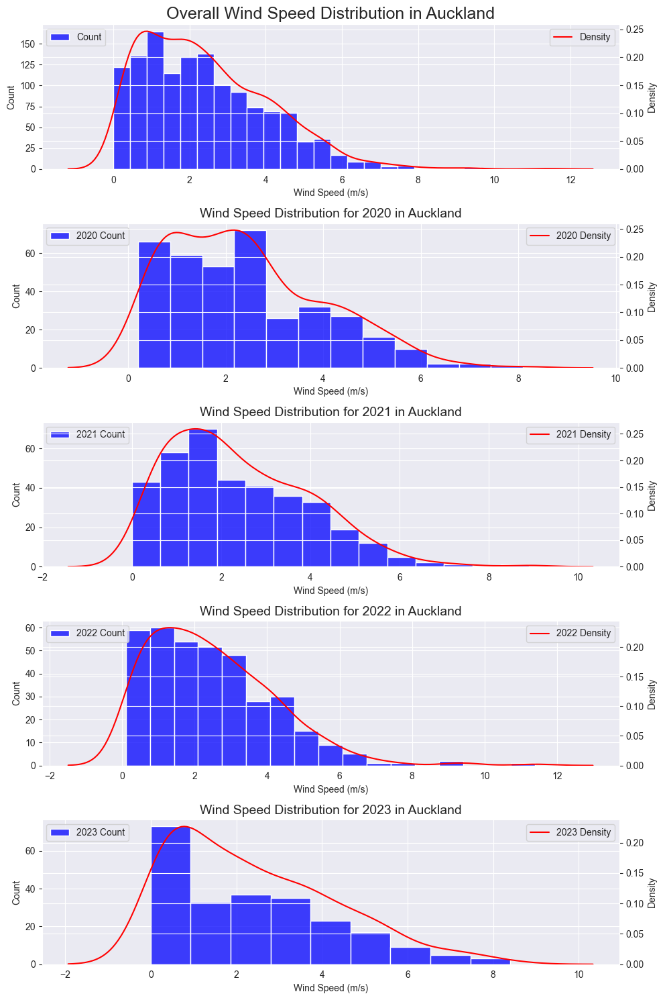

In [47]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['WSpd(m/s)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['WSpd(m/s)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['WSpd(m/s)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Wind Speed Distribution in Auckland",
                  yaxis1=dict(title='Wind Speed (m/s)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['WSpd(m/s)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['WSpd(m/s)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Wind Speed Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('Wind Speed (m/s)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['WSpd(m/s)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['WSpd(m/s)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Wind Speed Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('Wind Speed (m/s)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Temperature

In [48]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Temperature for All Years'] + [f'Daily Average Temperature for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['T(C)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['T(C)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Temperature in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Temperature (\u00B0C)")

fig.show()

In [49]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['T(C)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['T(C)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Temperature in Auckland',
    xaxis_title='Month',
    yaxis_title='Temperature (\u00B0C)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['T(C)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['T(C)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Temperature in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='Temperature (\u00B0C)',
    height=500,
    width=1000
)

fig2.show()

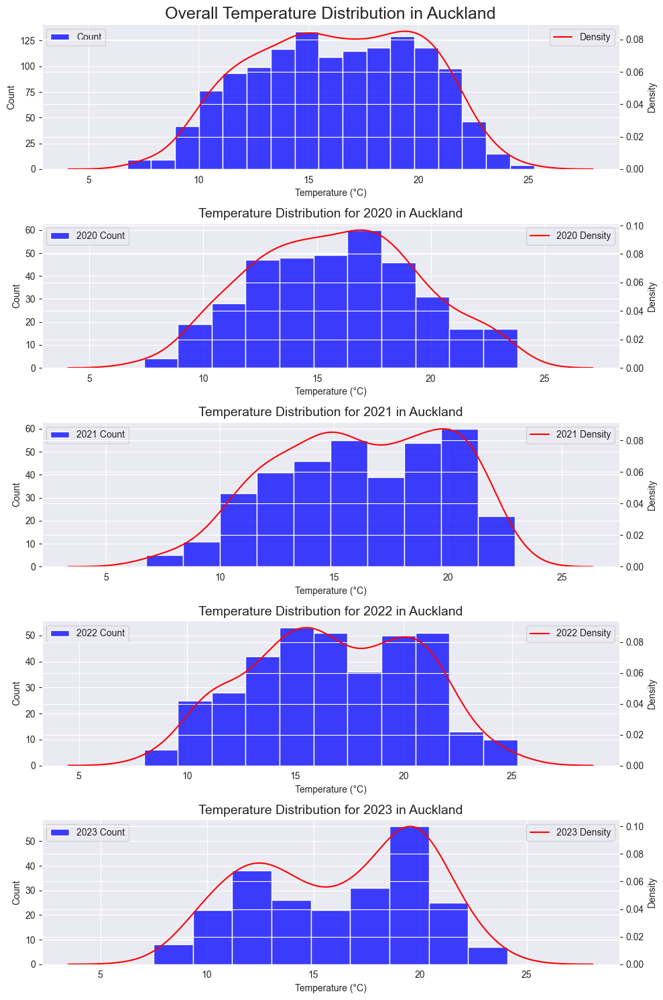

In [50]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['T(C)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['T(C)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['T(C)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Temperature Distribution in Auckland",
                  yaxis1=dict(title='Temperature (\u00B0C)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['T(C)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['T(C)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Temperature Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('Temperature (\u00B0C)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['T(C)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['T(C)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Temperature Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('Temperature (\u00B0C)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Relative humidity

In [51]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Relative Humidity for All Years'] + [f'Daily Average Relative Humidity for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['RH(%)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['RH(%)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Relative Humidity in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Humidity (%)")

fig.show()

In [52]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['RH(%)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['RH(%)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Relative Humidity in Auckland',
    xaxis_title='Month',
    yaxis_title='Humidity (%)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['RH(%)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['RH(%)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Relative Humidity in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='Humidity (%)',
    height=500,
    width=1000
)

fig2.show()

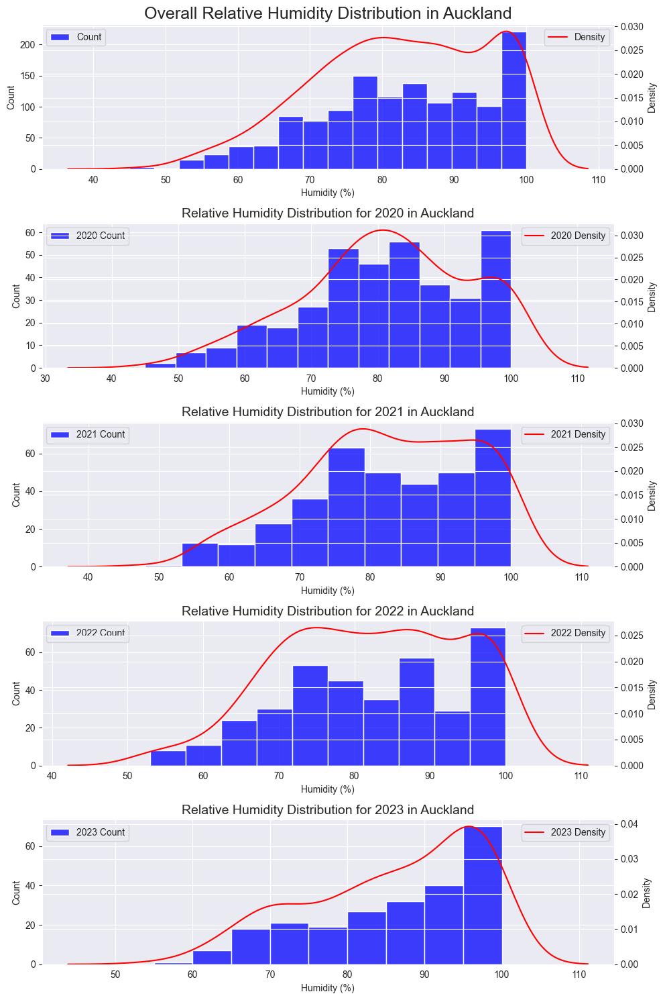

In [53]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['RH(%)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['RH(%)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['RH(%)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Relative Humidity Distribution in Auckland",
                  yaxis1=dict(title='Humidity (%)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['RH(%)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['RH(%)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Relative Humidity Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('Humidity (%)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['RH(%)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['RH(%)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Relative Humidity Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('Humidity (%)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Traffic count

In [54]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Traffic for All Years'] + [f'Daily Average Traffic for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['trafficCount'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['trafficCount'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Traffic in Auckland by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Traffic Flow")

fig.show()



In [55]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['trafficCount'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['trafficCount'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Traffic in Auckland',
    xaxis_title='Month',
    yaxis_title='Traffic Flow',
    height=500,
    width=1000
)

fig.show()

# Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['trafficCount'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['trafficCount'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Traffic in Auckland',
    xaxis_title='Day of Week',
    yaxis_title='Traffic Flow',
    height=500,
    width=1000
)

fig2.show()

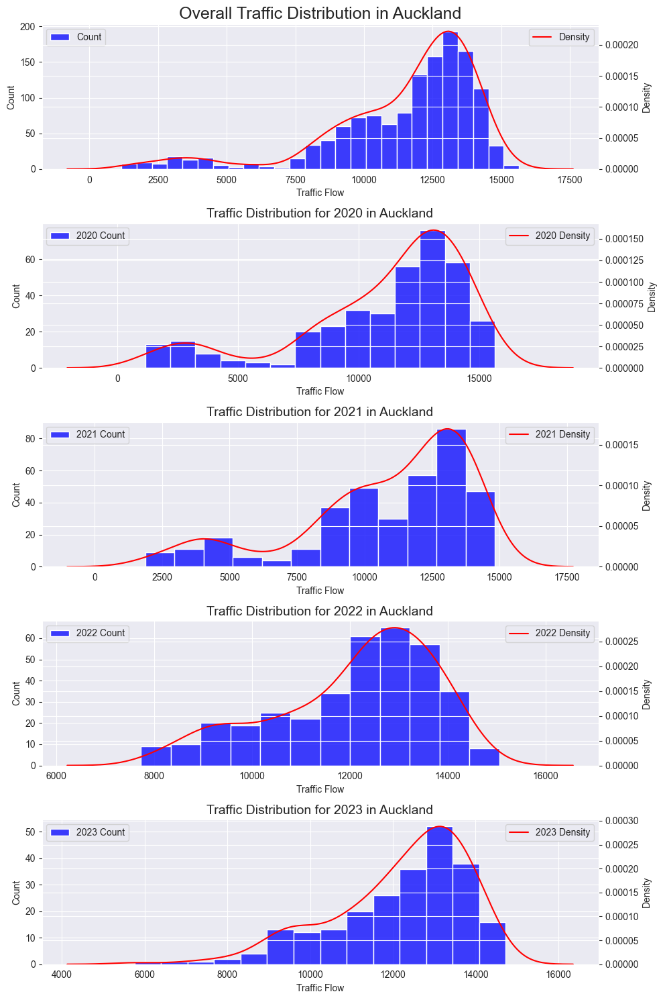

In [56]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['trafficCount'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['trafficCount'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['trafficCount'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Traffic Distribution in Auckland",
                  yaxis1=dict(title='Traffic Flow'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['trafficCount'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['trafficCount'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Traffic Distribution in Auckland', fontsize=18)
axs[0].set_xlabel('Traffic Flow')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['trafficCount'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['trafficCount'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Traffic Distribution for {year} in Auckland', fontsize=14)
    ax.set_xlabel('Traffic Flow')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

## Correlation Analysis

Text(0.5, 1.0, 'Correlation Matrix for Auckland')

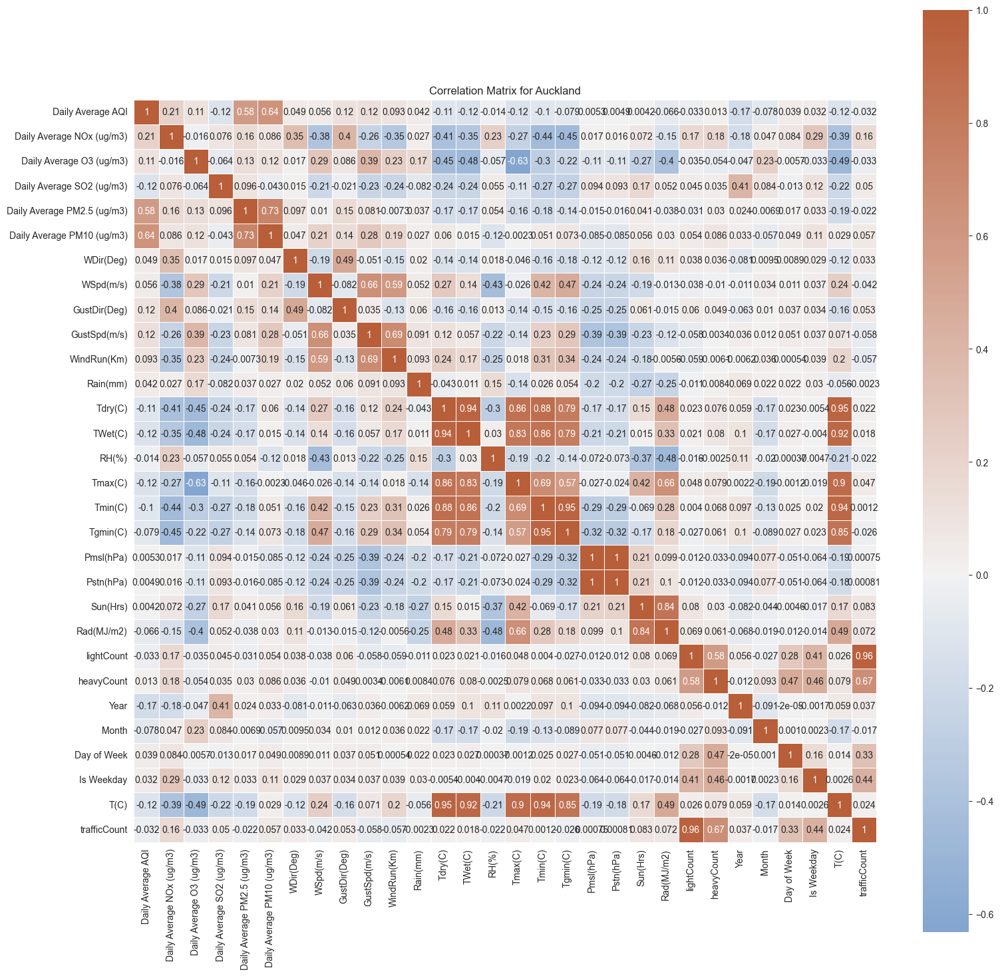

In [57]:
air_df06 = air_df04.copy()
air_df06 = air_df04.drop(['Date', 'ET10(C)','ET20(C)', 'ET100(C)'], axis=1)

corr =air_df06.corr()

# sns.heatmap(corr, annot=True, fmt=".2f")
# sns.set(rc={'figure.figsize':(30,30)})

f, ax = plt.subplots(figsize=(18, 18))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmax=None, center=0, square=True, annot=True, linewidths=.5)

plt.title('Correlation Matrix for Auckland')

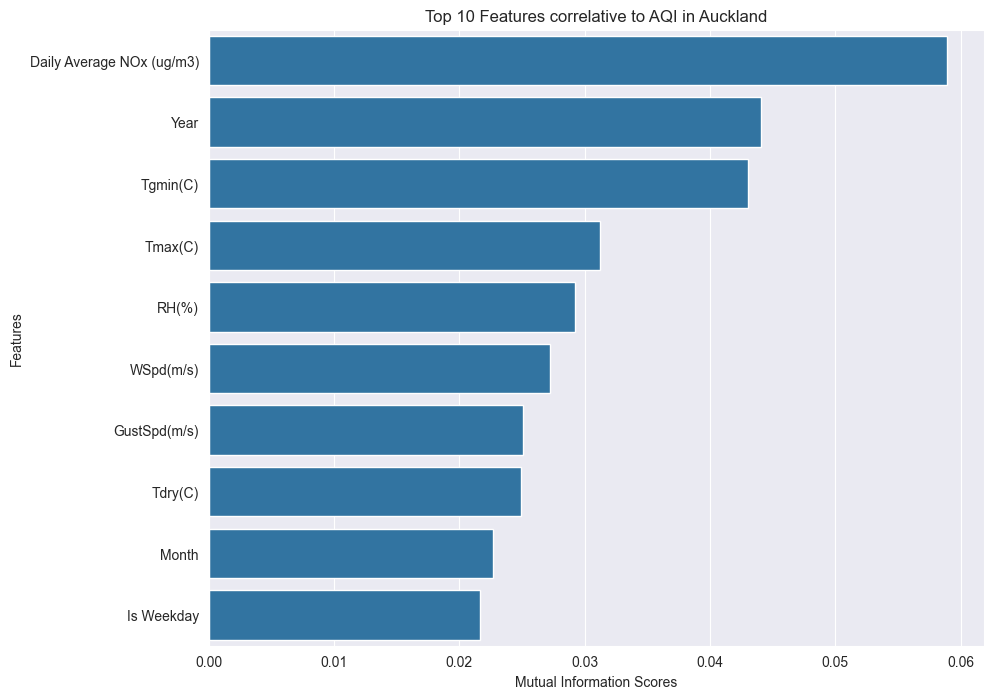

In [58]:
# Assuming AQI as target feature
X = air_df06.drop(['Daily Average AQI', 'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)', 'T(C)', 'trafficCount'], axis=1)
y = air_df06['Daily Average AQI']

# Select 10 best variables using ANOVA
selector = SelectKBest(mutual_info_regression, k=10)
selector.fit(X, y)

support = selector.get_support()
features = X.loc[:,support].columns.tolist()
scores = selector.scores_[support]

features_scores = pd.DataFrame({'Feature': features, 'Score': scores})
features_scores = features_scores.sort_values(by='Score', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Score', y='Feature', data=features_scores)
plt.title('Top 10 Features correlative to AQI in Auckland')
plt.xlabel('Mutual Information Scores')
plt.ylabel('Features')
plt.show()

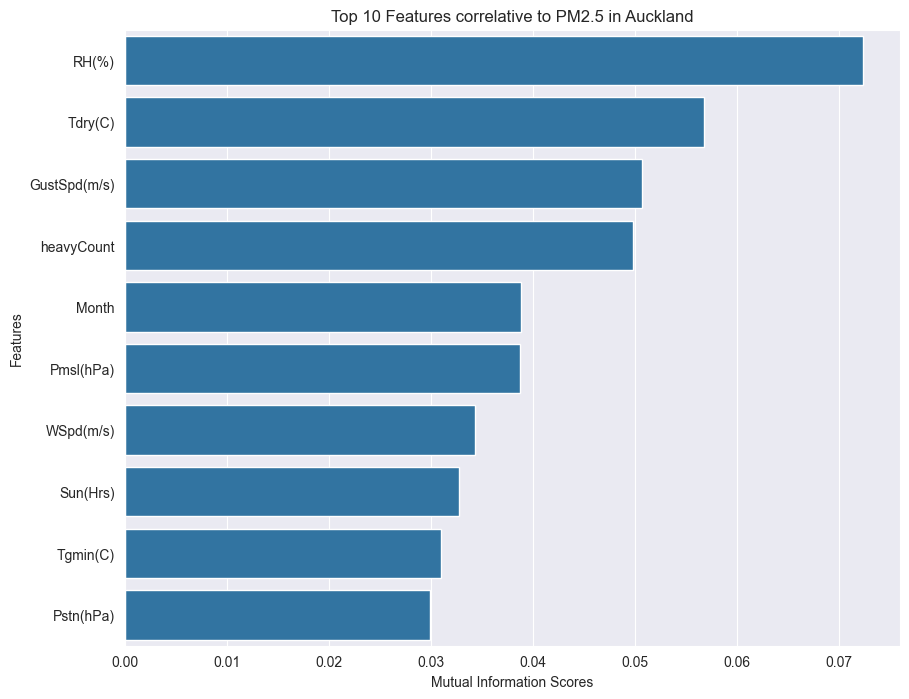

In [59]:
# Assuming PM2.5 as target feature
X = air_df06.drop(['Daily Average AQI', 'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)', 'T(C)', 'trafficCount'], axis=1)
y = air_df06['Daily Average PM2.5 (ug/m3)']

# Select 10 best variables using ANOVA
selector = SelectKBest(mutual_info_regression, k=10)
selector.fit(X, y)

support = selector.get_support()
features = X.loc[:,support].columns.tolist()
scores = selector.scores_[support]

features_scores = pd.DataFrame({'Feature': features, 'Score': scores})
features_scores = features_scores.sort_values(by='Score', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Score', y='Feature', data=features_scores)
plt.title('Top 10 Features correlative to PM2.5 in Auckland')
plt.xlabel('Mutual Information Scores')
plt.ylabel('Features')
plt.show()

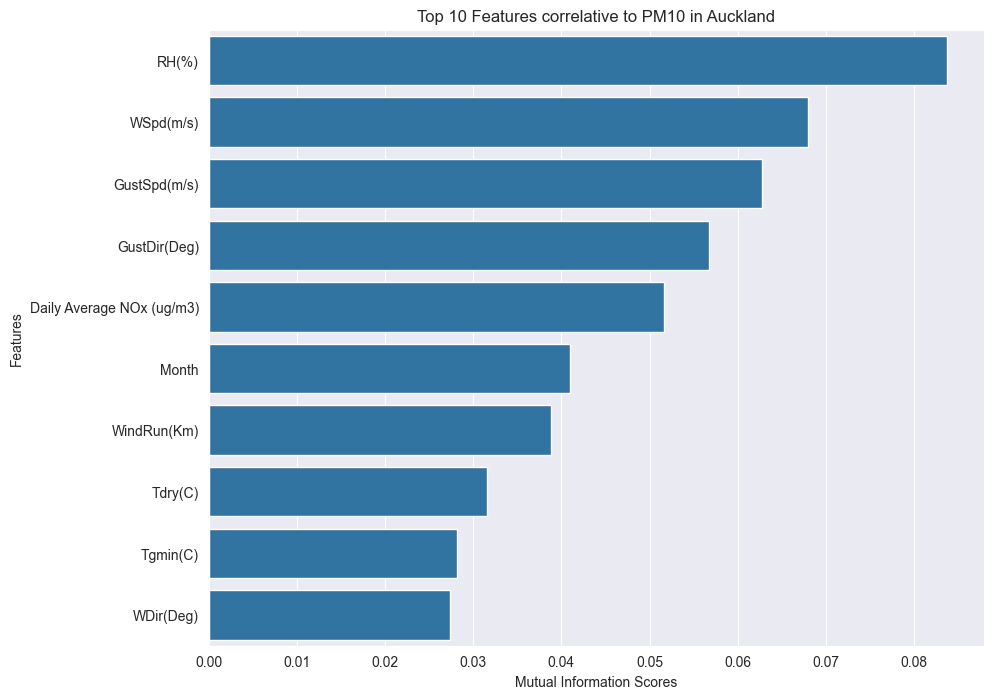

In [60]:
# Assuming PM10 as target feature
X = air_df06.drop(['Daily Average AQI', 'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)', 'T(C)', 'trafficCount'], axis=1)
y = air_df06['Daily Average PM10 (ug/m3)']

# Select 10 best variables using ANOVA
selector = SelectKBest(mutual_info_regression, k=10)
selector.fit(X, y)

support = selector.get_support()
features = X.loc[:,support].columns.tolist()
scores = selector.scores_[support]

features_scores = pd.DataFrame({'Feature': features, 'Score': scores})
features_scores = features_scores.sort_values(by='Score', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Score', y='Feature', data=features_scores)
plt.title('Top 10 Features correlative to PM10 in Auckland')
plt.xlabel('Mutual Information Scores')
plt.ylabel('Features')
plt.show()

### NOx

In [61]:
fig = make_subplots(rows=1, cols=3, subplot_titles=['NOx and AQI', 'NOx and PM2.5', 'NOx and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'Daily Average NOx (ug/m3)', 'Daily Average AQI', 1, 1, True)
add_scatter_traces(fig, 'Daily Average NOx (ug/m3)', 'Daily Average PM2.5 (ug/m3)', 1, 2, False)
add_scatter_traces(fig, 'Daily Average NOx (ug/m3)', 'Daily Average PM10 (ug/m3)', 1, 3, False)

fig.update_layout(height=600, width=1200, title_text="NOx and Air Quality Relationships in Auckland")
fig.update_xaxes(title_text="NOx (ug/m3)")
fig.update_yaxes(title_text="AQI", row=1, col=1)
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=2)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=3)

fig.show()

### SO2

In [62]:
fig = make_subplots(rows=1, cols=3, subplot_titles=['SO2 and AQI', 'SO2 and PM2.5', 'SO2 and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'Daily Average SO2 (ug/m3)', 'Daily Average AQI', 1, 1, True)
add_scatter_traces(fig, 'Daily Average SO2 (ug/m3)', 'Daily Average PM2.5 (ug/m3)', 1, 2, False)
add_scatter_traces(fig, 'Daily Average SO2 (ug/m3)', 'Daily Average PM10 (ug/m3)', 1, 3, False)

fig.update_layout(height=600, width=1200, title_text="SO2 and Air Quality Relationships in Auckland")
fig.update_xaxes(title_text="SO2 (ug/m3)")
fig.update_yaxes(title_text="AQI", row=1, col=1)
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=2)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=3)

fig.show()

### Wind speed

In [63]:
fig = make_subplots(rows=1, cols=3, subplot_titles=['Wind Speed and AQI', 'Wind Speed and PM2.5', 'Wind Speed and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'WSpd(m/s)', 'Daily Average AQI', 1, 1, True)
add_scatter_traces(fig, 'WSpd(m/s)', 'Daily Average PM2.5 (ug/m3)', 1, 2, False)
add_scatter_traces(fig, 'WSpd(m/s)', 'Daily Average PM10 (ug/m3)', 1, 3, False)

fig.update_layout(height=600, width=1200, title_text="Wind Speed and Air Quality Relationships in Auckland")
fig.update_xaxes(title_text="Wind Speed (m/s)")
fig.update_yaxes(title_text="AQI", row=1, col=1)
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=2)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=3)

fig.show()

### Temperature

In [64]:
fig = make_subplots(rows=1, cols=3, subplot_titles=['Temperature and AQI', 'Temperature and PM2.5', 'Temperature and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'T(C)', 'Daily Average AQI', 1, 1, True)
add_scatter_traces(fig, 'T(C)', 'Daily Average PM2.5 (ug/m3)', 1, 2, False)
add_scatter_traces(fig, 'T(C)', 'Daily Average PM10 (ug/m3)', 1, 3, False)

fig.update_layout(height=600, width=1200, title_text="Temperature and Air Quality Relationships in Auckland")
fig.update_xaxes(title_text="Temperature (\u00B0C)")
fig.update_yaxes(title_text="AQI", row=1, col=1)
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=2)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=3)

fig.show()

### Relative humidity

In [65]:
fig = make_subplots(rows=1, cols=3, subplot_titles=['Humidity and AQI', 'Humidity and PM2.5', 'Humidity and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'RH(%)', 'Daily Average AQI', 1, 1, True)
add_scatter_traces(fig, 'RH(%)', 'Daily Average PM2.5 (ug/m3)', 1, 2, False)
add_scatter_traces(fig, 'RH(%)', 'Daily Average PM10 (ug/m3)', 1, 3, False)

fig.update_layout(height=600, width=1200, title_text="Relative Humidity and Air Quality Relationships in Auckland")
fig.update_xaxes(title_text="Humidity (%)")
fig.update_yaxes(title_text="AQI", row=1, col=1)
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=2)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=3)

fig.show()

### Traffic count

In [66]:
fig = make_subplots(rows=1, cols=3, subplot_titles=['Traffic and AQI', 'Traffic and PM2.5', 'Traffic and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'trafficCount', 'Daily Average AQI', 1, 1, True)
add_scatter_traces(fig, 'trafficCount', 'Daily Average PM2.5 (ug/m3)', 1, 2, False)
add_scatter_traces(fig, 'trafficCount', 'Daily Average PM10 (ug/m3)', 1, 3, False)

fig.update_layout(height=600, width=1200, title_text="Traffic and Air Quality Relationships in Auckland")
fig.update_xaxes(title_text="Traffic Flow")
fig.update_yaxes(title_text="AQI", row=1, col=1)
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=2)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=3)

fig.show()